In [1]:
import pandas as pd
import numpy as np

import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression

import xgboost as xgb
from prophet import Prophet
from xgboost import plot_importance, plot_tree
from catboost import CatBoostRegressor, Pool

# Статистический тест Дики-Фуллера
from statsmodels.tsa.stattools import adfuller

import matplotlib.pyplot as plt 
import plotly.offline as py
import plotly.graph_objs as go
from statsmodels.graphics.tsaplots import plot_predict
py.init_notebook_mode()

%matplotlib inline
import zipfile


In [2]:
%pip install gdown
!gdown --fuzzy https://drive.google.com/file/d/1i2WS6RQo32syz1DUIPdo5bdaSM_XcJq_/view?usp=share_link

zip_ref = zipfile.ZipFile("train.zip", 'r')
zip_ref.extractall()
zip_ref.close()
df = pd.read_csv('train.csv')

Note: you may need to restart the kernel to use updated packages.
Downloading...
From (uriginal): https://drive.google.com/uc?id=1i2WS6RQo32syz1DUIPdo5bdaSM_XcJq_
From (redirected): https://drive.google.com/uc?id=1i2WS6RQo32syz1DUIPdo5bdaSM_XcJq_&confirm=t&uuid=21f601f8-8b3f-4013-933b-58743807820d
To: /kaggle/working/train.zip
100%|█████████████████████████████████████████| 838M/838M [00:06<00:00, 124MB/s]


/tmp/ipykernel_32/3646487572.py:7: DtypeWarning:

Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.



In [3]:
df

,id,date,store_nbr,item_nbr,unit_sales,onpromotion
0,0,2013-01-01,25,103665,7.0,NaN
1,1,2013-01-01,25,105574,1.0,NaN
2,2,2013-01-01,25,105575,2.0,NaN
3,3,2013-01-01,25,108079,1.0,NaN
4,4,2013-01-01,25,108701,1.0,NaN
...,...,...,...,...,...,...
125497035,125497035,2017-08-15,54,2089339,4.0,False
125497036,125497036,2017-08-15,54,2106464,1.0,True
125497037,125497037,2017-08-15,54,2110456,192.0,False
125497038,125497038,2017-08-15,54,2113914,198.0,True


In [4]:
# Отбор данных для магазина 25
df_25 = df[df.store_nbr==25].groupby("date")['unit_sales'].sum().reset_index()
# Приведение индекса в формат Datetime
df_25 = df_25.set_index(pd.DatetimeIndex(df_25['date']))
df_25.drop(['date'], axis=1, inplace=True)
df_25.head()

,unit_sales
date,
2013-01-01,2511.619
2013-01-02,5316.224
2013-01-03,4442.913
2013-01-04,4844.354
2013-01-05,5817.526


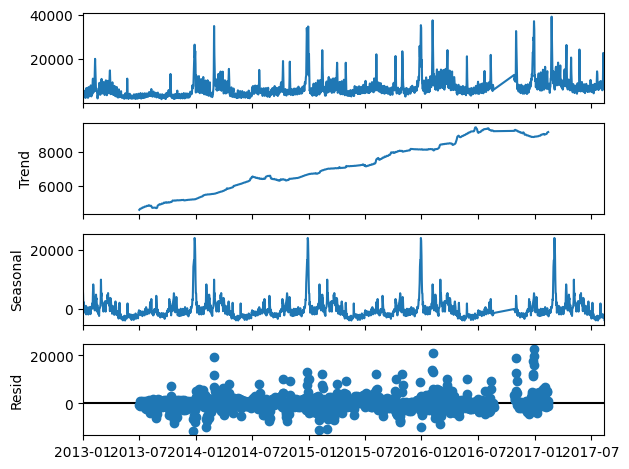

In [5]:
# Разложение ряда на трендовую, сезонную и шумовую составляющие
decomposition = seasonal_decompose(df_25, model='additive', period=365)
decomposition.plot()
plt.show()

In [6]:
trend_part = decomposition.trend # отдельно трендовая составляющаяя
seasonal_part = decomposition.seasonal # отдельно сезонная составляющаяя
residual_part = decomposition.resid # отдельно шум: то, что осталось

In [7]:
# Выполнение теста Дики-Фуллера на стационарность
test = adfuller(df_25)
print('Выполнение статистического теста на стационарность:')
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('Ответ: ряд не стационарен')
else:
    print ('Ответ: ряд стационарен')

Выполнение статистического теста на стационарность:
adf:  -4.858992665318181
p-value:  4.1883941929077723e-05
Critical values:  {'1%': -3.4344642432857992, '5%': -2.8633571955690647, '10%': -2.5677374399794197}
Ответ: ряд стационарен


In [8]:
# Разеделение датасета на тренировочную и тестовую выборки
tscv = TimeSeriesSplit(n_splits=3, test_size=7)
train_test_groups = tscv.split(df_25) 
for train_index, test_index in train_test_groups:
    print("TRAIN size:", len(train_index), "TEST size:", len(test_index))
# Расчет факторов
# Скользящее среднее c окном 5
df_25['rolling_mean'] = df_25.unit_sales.rolling(window=5).mean()
# Скользящее квадратическое отклонение c окном 5
df_25['rolling_std']  = df_25.unit_sales.rolling(window=5).std()
# Линии Боллинджера с окном в 30
df_25['Bol_upper'] = df_25.unit_sales.rolling(window=30).mean() + 3*df_25.unit_sales.rolling(window=30).std()
df_25['Bol_lower'] = df_25.unit_sales.rolling(window=30).mean() - 3*df_25.unit_sales.rolling(window=30).std()

TRAIN size: 1597 TEST size: 7
TRAIN size: 1604 TEST size: 7
TRAIN size: 1611 TEST size: 7


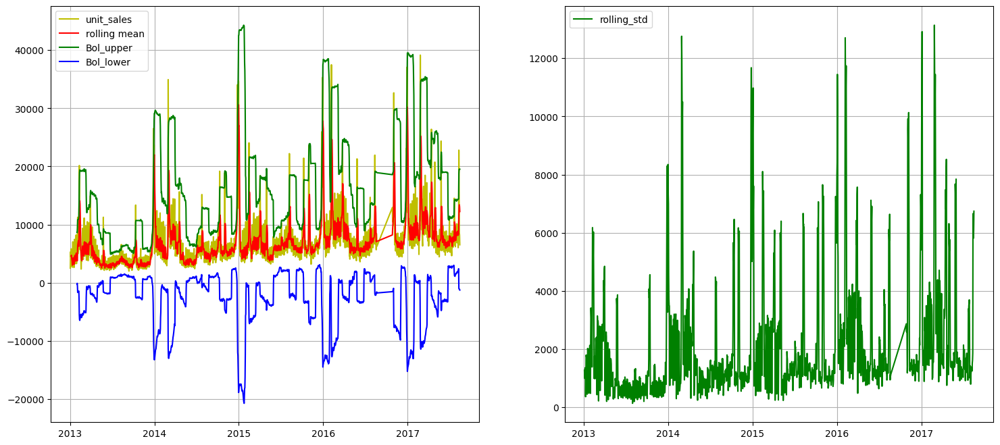

In [9]:
## Визуализация
f, ax = plt.subplots(1, 2, figsize=(18, 8))
ax[0].plot(df_25.index, df_25.unit_sales, c='y') ## исходные данные
ax[0].plot(df_25.index, df_25.rolling_mean, c='r') ## оконное среднее
ax[0].plot(df_25.index, df_25.Bol_upper,  c='g') ## линии Боллинджера
ax[0].plot(df_25.index, df_25.Bol_lower,  c='b') ## линии Боллинджера
ax[0].legend(['unit_sales', 'rolling mean', 'Bol_upper', 'Bol_lower'])
ax[0].grid()

ax[1].plot(df_25.index, df_25.rolling_std, c='g') ## оконное стандартное отклонение
ax[1].legend(['rolling_std'])
ax[1].grid()
plt.show()

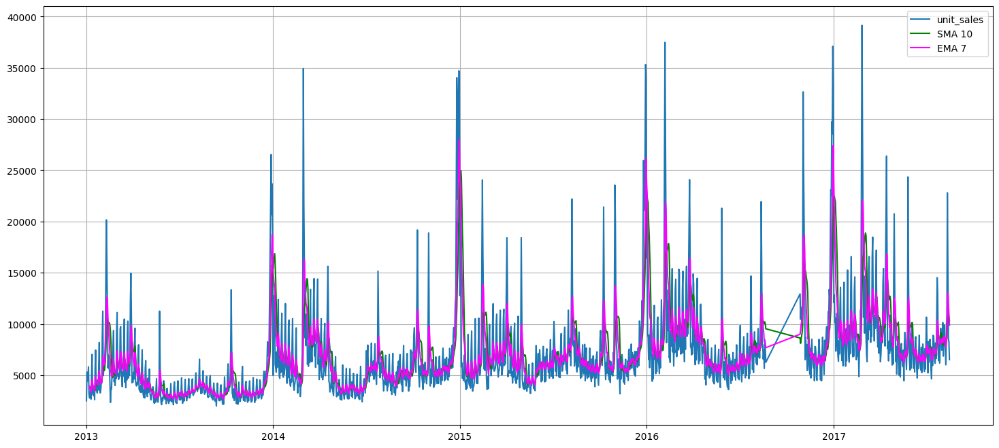

In [10]:
##  оконное среднее с окном в 10 точек
df_25['rolling_mean_' + str(10)] = df_25.unit_sales.rolling(window=10).mean()
## экспоненциально среднее с окном в 7 точек
df_25['rolling_ema_' + str(7)] = df_25.unit_sales.ewm(min_periods=7, span=7).mean()
## визуализация
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_25.index, df_25.unit_sales) ## исходные данные
# ax.plot(df.ts, df.rolling_mean_10, c='r') ## оконное среднее
ax.plot(df_25.index, df_25['rolling_mean_' + str(10)],  c='g') ## оконное среднее
ax.plot(df_25.index, df_25['rolling_ema_'  + str(7)],  c='magenta') ## оконное экспоненциально среднее
ax.legend(['unit_sales', 'SMA ' + str(10), 'EMA ' + str(7)])
ax.grid()

In [11]:
# Вычисление индексов по требуемым условиям
mean_dif = np.sign(df_25.unit_sales.rolling(window=50).mean() - df_25.unit_sales.ewm(min_periods=10, span=10).mean()).diff()
mean_dif[mean_dif > 0].index

DatetimeIndex(['2013-02-20', '2013-02-26', '2013-03-05', '2013-03-11',
               '2013-03-17', '2013-03-24', '2013-04-08', '2013-05-28',
               '2013-07-01', '2013-07-08', '2013-08-27', '2013-09-02',
               '2013-10-21', '2013-11-03', '2013-12-05', '2014-01-16',
               '2014-01-19', '2014-04-01', '2014-04-20', '2014-06-09',
               '2014-06-24', '2014-08-06', '2014-09-08', '2014-09-23',
               '2014-09-25', '2014-10-20', '2014-11-07', '2014-12-02',
               '2014-12-07', '2015-01-10', '2015-02-25', '2015-03-02',
               '2015-03-10', '2015-03-16', '2015-03-23', '2015-03-30',
               '2015-04-13', '2015-05-05', '2015-07-16', '2015-07-30',
               '2015-08-19', '2015-08-23', '2015-10-20', '2015-11-09',
               '2016-01-11', '2016-02-15', '2016-02-23', '2016-02-29',
               '2016-03-06', '2016-04-05', '2016-04-10', '2016-06-06',
               '2016-07-05', '2016-07-12', '2016-11-11', '2017-01-11',
      

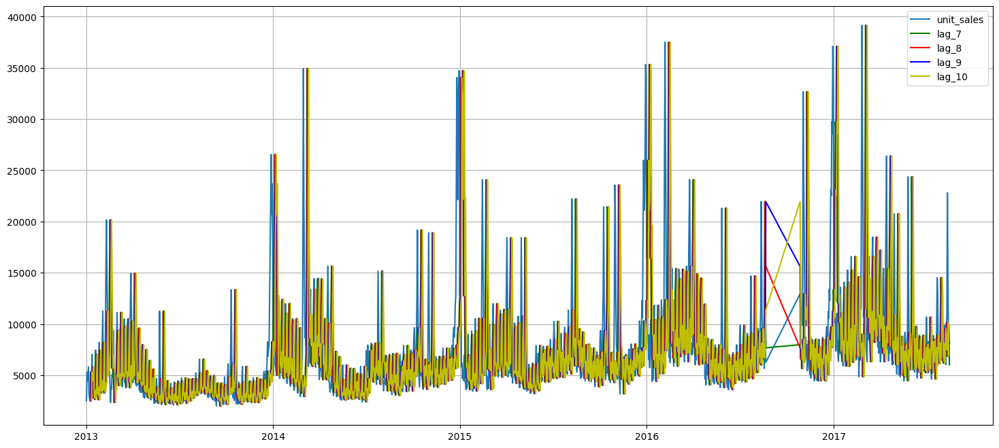

In [12]:
for i in range(7,11):
    df_25['lag_{}'.format(i)] = df_25.unit_sales.shift(i)


## Визуализация
f, ax = plt.subplots(1, 1, figsize=(18, 8))
ax.plot(df_25.index, df_25.unit_sales) ## исходные данные
ax.plot(df_25.index, df_25['lag_' + str(7)],  c='g') 
ax.plot(df_25.index, df_25['lag_' + str(8)],  c='r') 
ax.plot(df_25.index, df_25['lag_' + str(9)],  c='b') 
ax.plot(df_25.index, df_25['lag_' + str(10)],  c='y') 
ax.legend(['unit_sales', 'lag_7', 'lag_8', 'lag_9', 'lag_10'])
ax.grid()

## Построение модели скользящего среднего

In [13]:
# Отбор требуемых по заданию данных
df_103501 = df[df.item_nbr == 103501].groupby('date').sum()['unit_sales'].reset_index()
df_103501.head()

,date,unit_sales
0,2013-01-02,185.0
1,2013-01-03,153.0
2,2013-01-04,155.0
3,2013-01-05,160.0
4,2013-01-06,173.0


In [14]:
# Приведение индекса в формат Datetime
df_103501 = df_103501.set_index(pd.DatetimeIndex(df_103501['date']))
df_103501.drop(['date'], axis=1, inplace=True)
df_103501.head()

,unit_sales
date,
2013-01-02,185.0
2013-01-03,153.0
2013-01-04,155.0
2013-01-05,160.0
2013-01-06,173.0


In [15]:
# Выполнение теста Дики-Фуллера на стационарность
test = adfuller(df_103501)
print('Выполнение статистического теста на стационарность:')
print ('adf: ', test[0] )
print ('p-value: ', test[1])
print ('Critical values: ', test[4])
if test[0]> test[4]['5%']: # проверка, больше ли критического полученное значение для нашего ряда 
    print ('Ответ: ряд не стационарен')
else:
    print ('Ответ: ряд стационарен')

Выполнение статистического теста на стационарность:
adf:  -4.154403058014619
p-value:  0.0007863083913836295
Critical values:  {'1%': -3.4344462031760283, '5%': -2.8633492329988335, '10%': -2.5677331999518147}
Ответ: ряд стационарен


(6,) (6, 1)
mean_squared_error 287.09
mean_absolute_error 13.42
mean_absolute_percentage_error 17.0


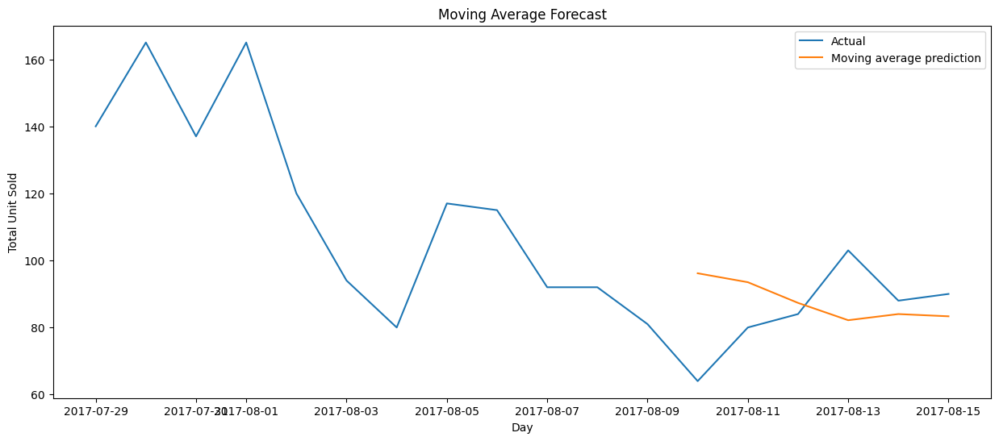

In [16]:
# Модель скользящего среднего
def moving_average_forecast(series, window_size):
    forecast = []
    for time in range(len(series) - window_size):
        forecast.append(series[time:time + window_size].values.mean())
    return np.array(forecast)


moving_average_days = 6

shown_train_size = moving_average_days * 3
moving_avg = moving_average_forecast(df_103501, moving_average_days)
moving_avg = pd.Series(moving_avg, index = df_103501[moving_average_days:].index)

print(moving_avg[-moving_average_days:].shape, df_103501[-moving_average_days:].shape)

print("mean_squared_error", round(mean_squared_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_error", round(mean_absolute_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_percentage_error", round(mean_absolute_percentage_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2) * 100)

plt.figure(figsize=(15,6))

plt.plot(df_103501[- shown_train_size:], label="Actual")
plt.plot(moving_avg[-moving_average_days:], label="Moving average prediction")
plt.ylabel("Total Unit Sold")
plt.xlabel("Day")
plt.title("Moving Average Forecast")
plt.legend(loc="upper right");

## Linear regression

[ 0.64655858 -0.09516676 -0.00451244 -0.00140731 -0.07257917  0.31685028]
21.211317097248283
mean_squared_error 128.34
mean_absolute_error 9.61
mean_absolute_percentage_error 10.0


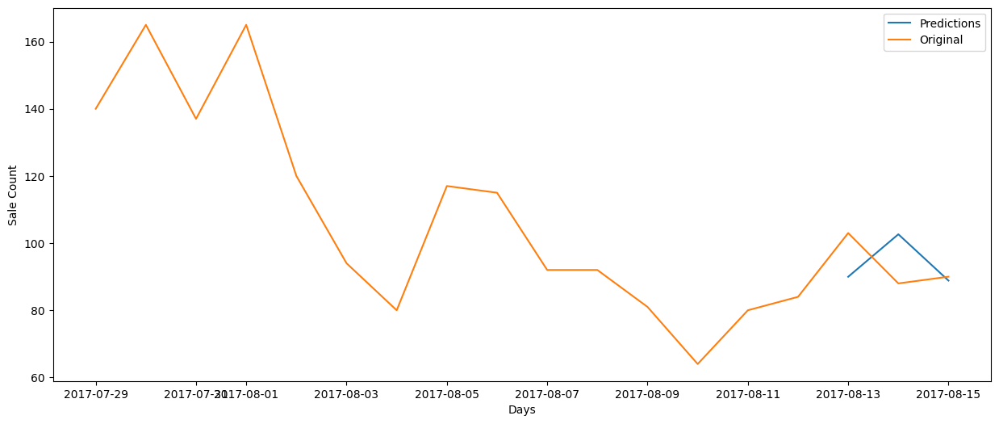

In [41]:
# построение Лагов с 1 по 6
df_lags = pd.DataFrame()

df_lags["Original Values"]  = df_103501
df_lags["shift1"] = df_lags["Original Values"].shift()
df_lags["shift2"] = df_lags["shift1"].shift()
df_lags["shift3"] = df_lags["shift2"].shift()
df_lags["shift4"] = df_lags["shift3"].shift()
df_lags["shift5"] = df_lags["shift4"].shift()
df_lags["shift6"] = df_lags["shift5"].shift()
df_lags.dropna(inplace=True)

# Разбиение на тренировочные и тестовые выборки
predict_size = 3

x_train, y_train = df_lags[:-predict_size].drop(["Original Values"], axis =1), df_lags[:-predict_size]["Original Values"]
x_test, y_test  = df_lags[-predict_size:].drop(["Original Values"], axis =1), df_lags[-predict_size:]["Original Values"]

reg = LinearRegression().fit(x_train, y_train)
print(reg.coef_)
print(reg.intercept_)


ar_predictions = pd.Series(reg.predict(x_test), index=x_test.index)

plt.figure(figsize=(15,6))
plt.plot(ar_predictions ,label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.xlabel("Days")
plt.ylabel("Sale Count")

print("mean_squared_error", round(mean_squared_error(y_test, ar_predictions), 2))
print("mean_absolute_error", round(mean_absolute_error(y_test, ar_predictions), 2))
print("mean_absolute_percentage_error", round(mean_absolute_percentage_error(y_test, ar_predictions), 2) * 100)

plt.legend(loc="upper right")

# ARIMA

Чтобы построить ARIMA модель нам нужно знать ее порядок, состоящий из 3-х параметров:

p — порядок компоненты AR
d — порядок интегрированного ряда
q — порядок компонетны MA

d мы уже знаем - это 0 осталось определить p и q

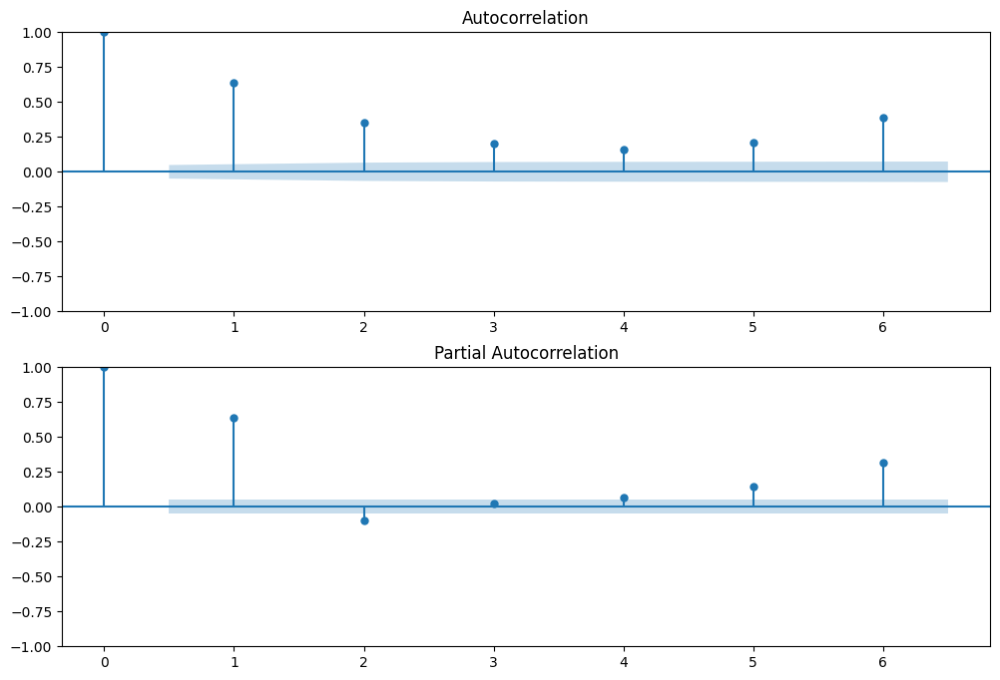

In [18]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(df_103501.values.squeeze(), lags=6, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(df_103501, lags=6, ax=ax2)

Можно сделать вывод, что p = 6, т.к. на ней все лаги сильно отличны от нуля. По коррелограмме ACF можно предположить, что q = 6, т.к. на лаг 6 значении функций резко возрастает.

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/opt/conda/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



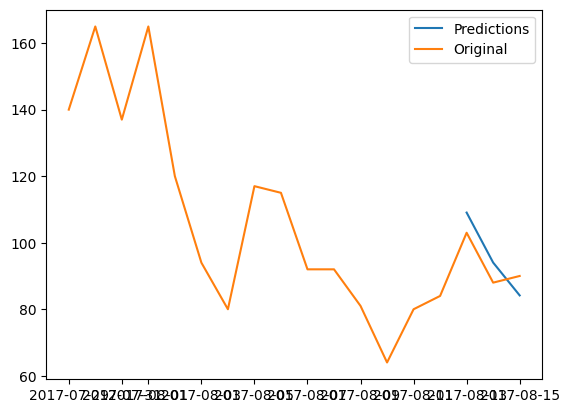

In [19]:
# Создание ARIMA модели
arima_model = ARIMA(y_train.values.reshape(-1), order=(6,0,6))
train_size = len(y_train)
test_size = predict_size
arima_predictions = arima_model.fit().predict(start=train_size, end=train_size+test_size -1,  dynamic=False)

plt.plot(pd.Series(arima_predictions, index=y_test.index), label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

# SARIMA

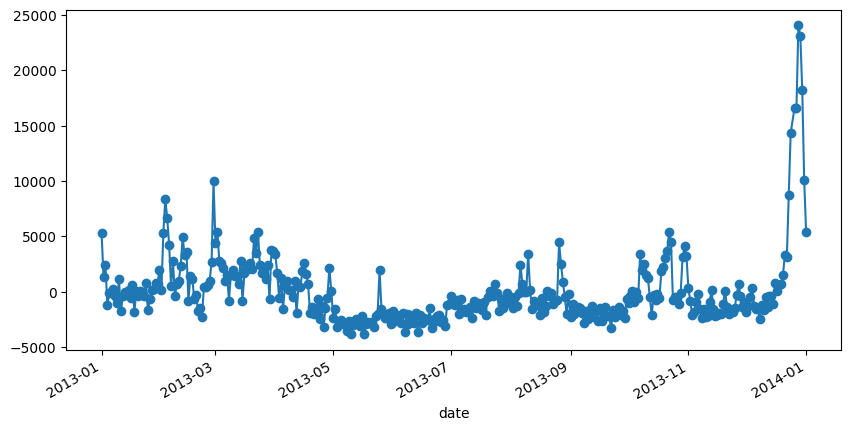

In [20]:
plt.rcParams["figure.figsize"] = 10, 5
seasonal_part[:365].plot(marker = "o")
plt.show()

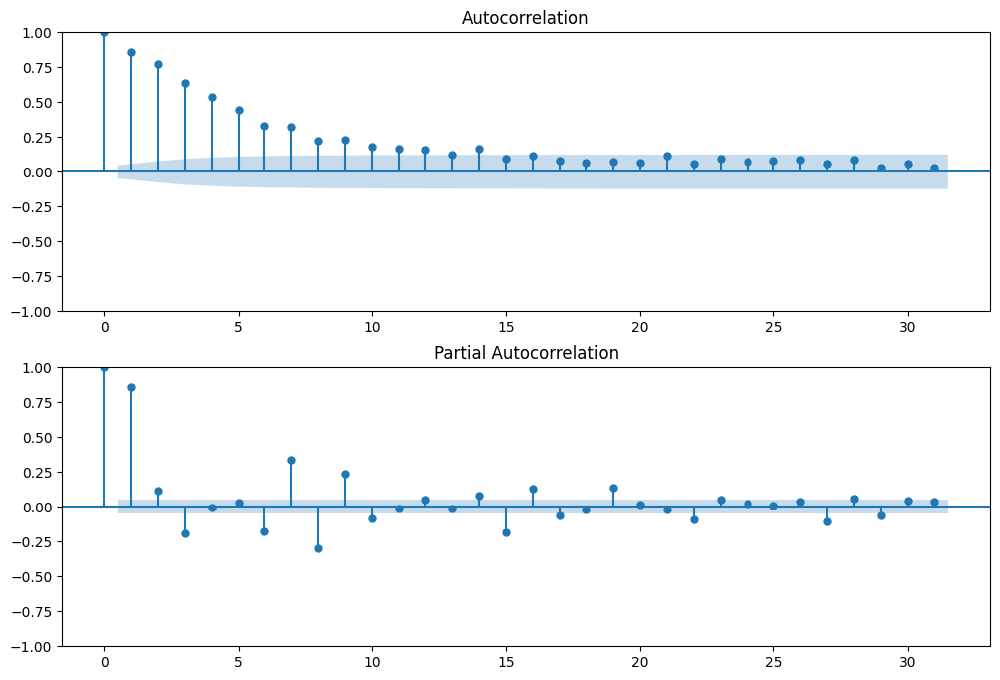

In [21]:
fig = plt.figure(figsize=(12,8))
ax1 = fig.add_subplot(211)
fig = sm.graphics.tsa.plot_acf(seasonal_part.squeeze(), lags=31, ax=ax1)
ax2 = fig.add_subplot(212)
fig = sm.graphics.tsa.plot_pacf(seasonal_part, lags=31, ax=ax2)

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:997: UserWarning:

Non-stationary starting seasonal autoregressive Using zeros as starting parameters.



RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           40     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  5.85099D+01    |proj g|=  1.24444D+02


 This problem is unconstrained.



At iterate    5    f=  4.82132D+00    |proj g|=  3.63973D-01

At iterate   10    f=  4.63941D+00    |proj g|=  5.75569D-02

At iterate   15    f=  4.60814D+00    |proj g|=  3.08739D-02

At iterate   20    f=  4.58907D+00    |proj g|=  2.95810D-02

At iterate   25    f=  4.58091D+00    |proj g|=  2.15535D-02

At iterate   30    f=  4.57784D+00    |proj g|=  1.90524D-02

At iterate   35    f=  4.57501D+00    |proj g|=  2.89978D-02

At iterate   40    f=  4.57297D+00    |proj g|=  1.38514D-02

At iterate   45    f=  4.57139D+00    |proj g|=  1.21282D-01


/opt/conda/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals




At iterate   50    f=  4.57034D+00    |proj g|=  1.77874D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   40     50     52      1     0     0   1.779D-02   4.570D+00
  F =   4.5703354739641222     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 


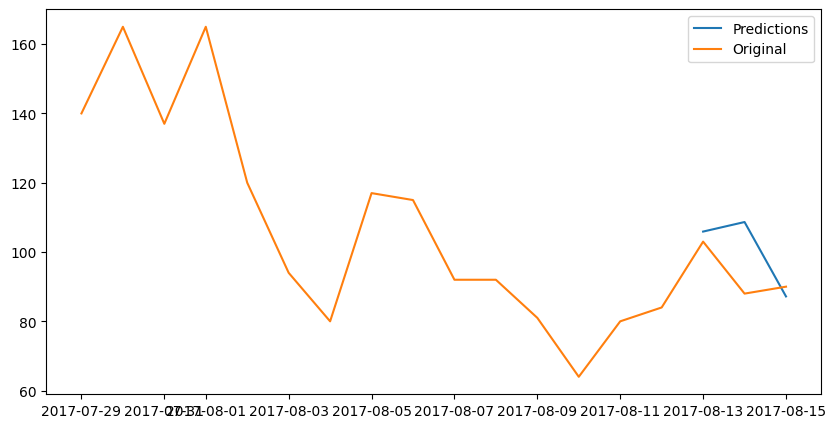

In [43]:
sarima_model = SARIMAX(y_train.values.reshape(-1), order = (6, 0, 6), seasonal_order = (15, 0, 12, 12))
train_size = len(y_train)
test_size = predict_size
sarima_predictions = sarima_model.fit().predict(start=train_size, end=train_size+test_size-1,  dynamic=False)

plt.plot(pd.Series(sarima_predictions, index=y_test.index), label = "Predictions")
plt.plot(pd.concat([y_train, y_test], axis = 0)[-shown_train_size:], label = "Original" )
plt.legend(loc="upper right");

С точки зрения значений метрик наилучшей моделью является модель ARIMA. 

# Prophet

In [24]:
df_holidays_events = pd.read_csv('/kaggle/input/favoritagrocerysalesforecastingextracted/holidays_events.csv')
holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


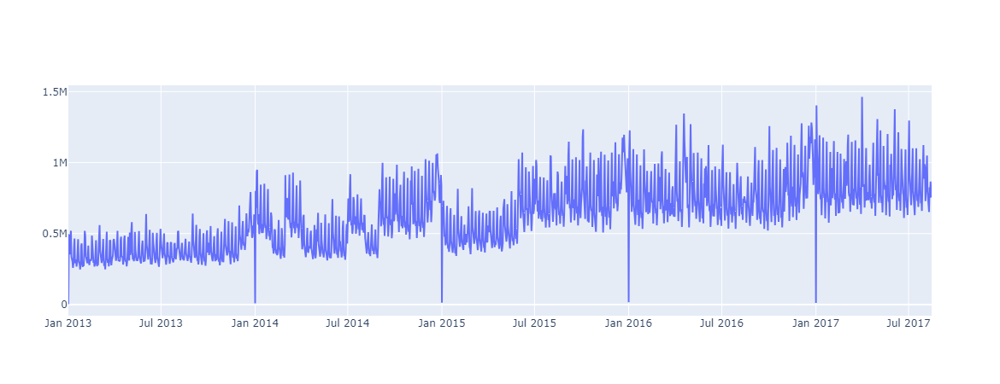

07:32:49 - cmdstanpy - INFO - Chain [1] start processing
07:32:49 - cmdstanpy - INFO - Chain [1] done processing


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,334324.927133,230732.982154,5.127565e+05,334324.927133,3.343249e+05,43509.441820,43509.441820,43509.441820,-68160.181280,-68160.181280,-68160.181280,111669.623100,111669.623100,111669.623100,0.0,0.0,0.0,3.778344e+05
1,2013-01-02,334694.925196,255759.248818,5.235878e+05,334694.925196,3.346949e+05,55554.466538,55554.466538,55554.466538,-44197.571116,-44197.571116,-44197.571116,99752.037654,99752.037654,99752.037654,0.0,0.0,0.0,3.902494e+05
2,2013-01-03,335064.923260,146921.658032,4.339064e+05,335064.923260,3.350649e+05,-44062.466084,-44062.466084,-44062.466084,-131877.370047,-131877.370047,-131877.370047,87814.903963,87814.903963,87814.903963,0.0,0.0,0.0,2.910025e+05
3,2013-01-04,335434.921323,213188.254085,4.941862e+05,335434.921323,3.354349e+05,19006.740860,19006.740860,19006.740860,-57029.758366,-57029.758366,-57029.758366,76036.499226,76036.499226,76036.499226,0.0,0.0,0.0,3.544417e+05
4,2013-01-05,335804.919386,408908.967220,6.752388e+05,335804.919386,3.358049e+05,198588.286289,198588.286289,198588.286289,134003.288011,134003.288011,134003.288011,64584.998278,64584.998278,64584.998278,0.0,0.0,0.0,5.343932e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2044,2018-08-11,995151.916643,910643.242962,1.208956e+06,945678.099642,1.046480e+06,62424.701458,62424.701458,62424.701458,134003.288011,134003.288011,134003.288011,-71578.586553,-71578.586553,-71578.586553,0.0,0.0,0.0,1.057577e+06
2045,2018-08-12,995424.038873,958121.296031,1.257575e+06,945755.666032,1.046880e+06,116337.000290,116337.000290,116337.000290,188401.975326,188401.975326,188401.975326,-72064.975035,-72064.975035,-72064.975035,0.0,0.0,0.0,1.111761e+06
2046,2018-08-13,995696.161102,760740.350299,1.042375e+06,945924.710944,1.047277e+06,-93030.391531,-93030.391531,-93030.391531,-21140.382528,-21140.382528,-21140.382528,-71890.009003,-71890.009003,-71890.009003,0.0,0.0,0.0,9.026658e+05
2047,2018-08-14,995968.283332,709818.391596,1.002196e+06,946093.755856,1.047674e+06,-139215.691572,-139215.691572,-139215.691572,-68160.181280,-68160.181280,-68160.181280,-71055.510292,-71055.510292,-71055.510292,0.0,0.0,0.0,8.567526e+05


In [25]:
# Подготовка данных
sales = df.groupby('date')['unit_sales'].sum()
py.iplot([go.Scatter(
    x=sales.index,
    y=sales
)])

sales = pd.DataFrame(sales).reset_index()
sales.columns = ['ds', 'y']
# Построение модели
m = Prophet()
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

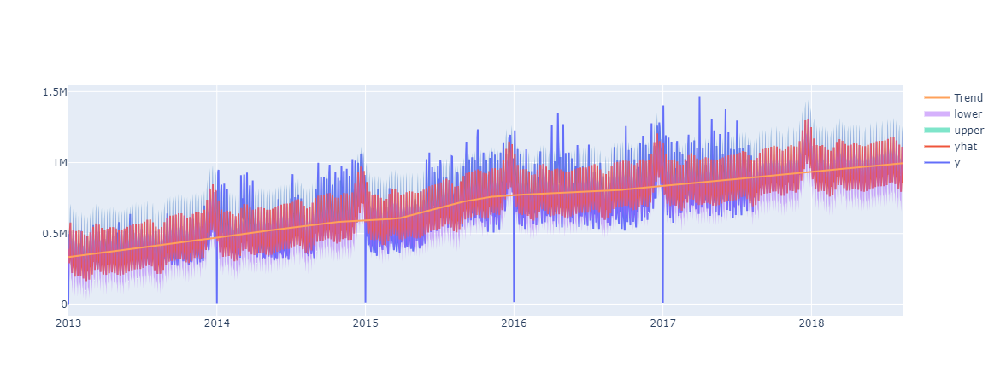

RMSE: 107830.140989


In [26]:
# Визуализация
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])
# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )

07:33:35 - cmdstanpy - INFO - Chain [1] start processing
07:33:35 - cmdstanpy - INFO - Chain [1] done processing


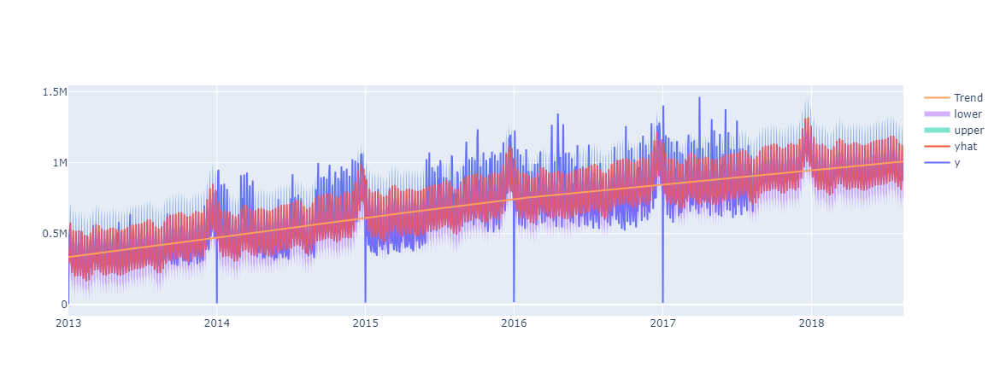

07:33:36 - cmdstanpy - INFO - Chain [1] start processing


RMSE (changepoint_prior_sacele = 0.01): 110873.213982


07:33:36 - cmdstanpy - INFO - Chain [1] done processing


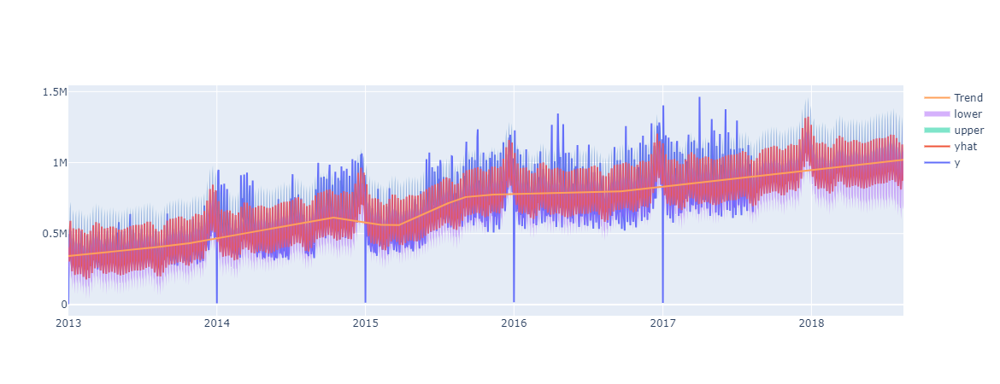

07:33:37 - cmdstanpy - INFO - Chain [1] start processing


RMSE (changepoint_prior_sacele = 0.1): 104417.479838


07:33:38 - cmdstanpy - INFO - Chain [1] done processing


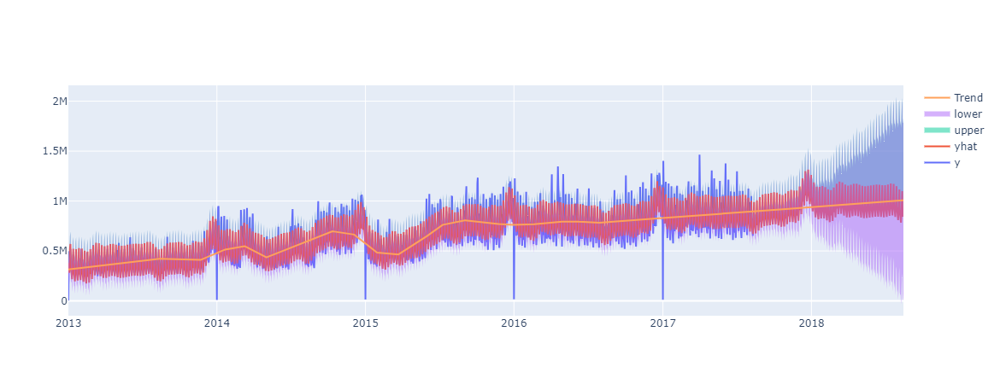

07:33:38 - cmdstanpy - INFO - Chain [1] start processing


RMSE (changepoint_prior_sacele = 1): 97805.133843


07:33:39 - cmdstanpy - INFO - Chain [1] done processing


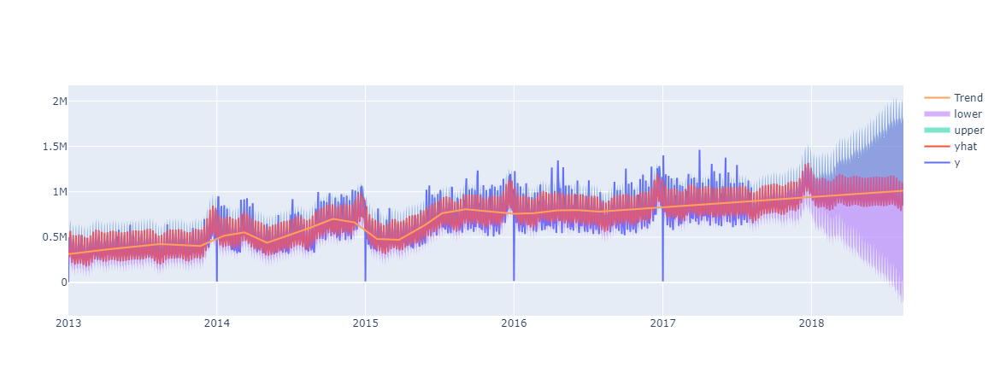

07:33:40 - cmdstanpy - INFO - Chain [1] start processing


RMSE (changepoint_prior_sacele = 1.5): 97671.442803


07:33:40 - cmdstanpy - INFO - Chain [1] done processing


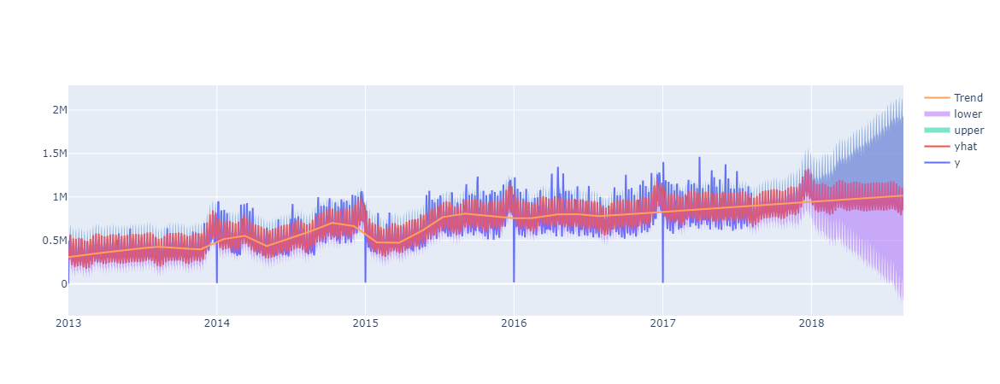

07:33:41 - cmdstanpy - INFO - Chain [1] start processing


RMSE (changepoint_prior_sacele = 2): 97584.070429


07:33:42 - cmdstanpy - INFO - Chain [1] done processing


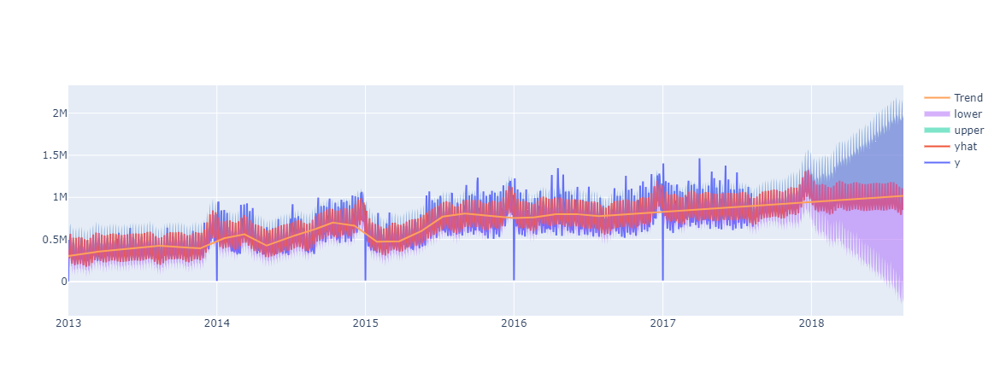

RMSE (changepoint_prior_sacele = 2.5): 97497.380178


In [28]:
scale_list = [0.01, 0.1, 1, 1.5, 2, 2.5]
for scale in scale_list:
    m = Prophet(changepoint_prior_scale=scale)
    m.fit(sales)
    future = m.make_future_dataframe(periods=365)
    forecast = m.predict(future)
    
    py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
    ])
    
    print(f'RMSE (changepoint_prior_sacele = {scale}): %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )

07:34:06 - cmdstanpy - INFO - Chain [1] start processing
07:34:08 - cmdstanpy - INFO - Chain [1] done processing


RMSE: 74168.981803


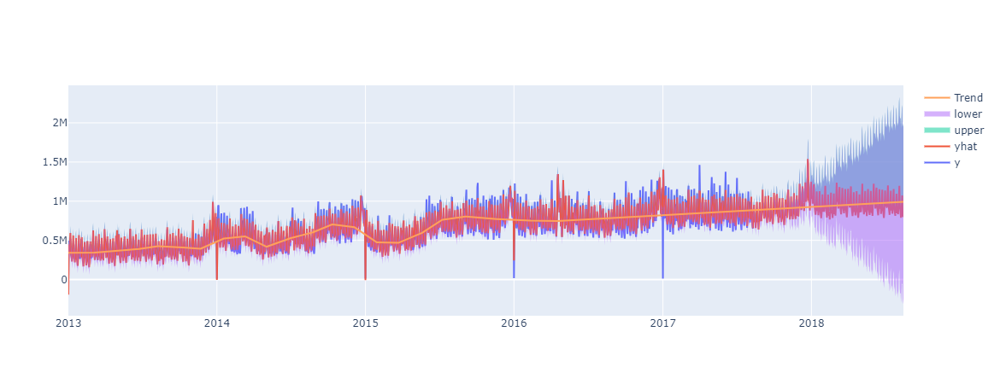

In [29]:
# Добавление месячной сезонности
m = Prophet(changepoint_prior_scale=2.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(sales)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

# Вычислим среднеквадратичную ошибку.
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:1682, 'yhat']-sales['y'])**2)) )
py.iplot([
    go.Scatter(x=sales['ds'], y=sales['y'], name='y'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat'], name='yhat'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_upper'], fill='tonexty', mode='none', name='upper'),
    go.Scatter(x=forecast['ds'], y=forecast['yhat_lower'], fill='tonexty', mode='none', name='lower'),
    go.Scatter(x=forecast['ds'], y=forecast['trend'], name='Trend')
])

Добавление месячной сезонности улучшило показатель метрики RMSE до 74171.53. При этом модель все еще не смогла улавить скачок вниз в 2017 году.

# XGBoost

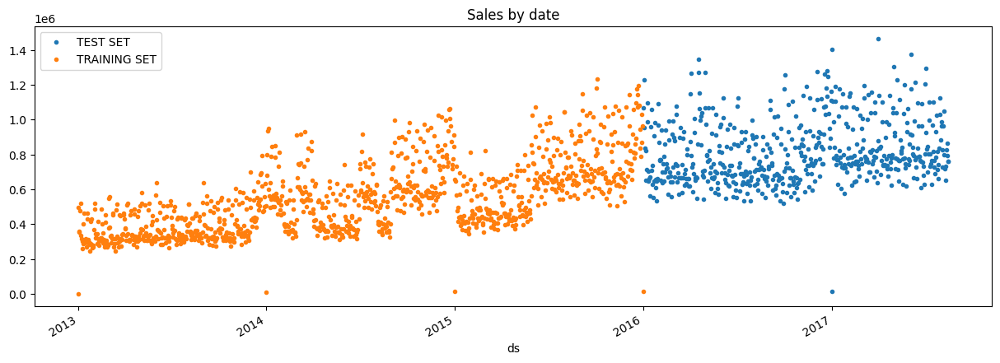

In [30]:
split_date = '2016-01-01'
sales_train = sales.loc[sales.ds <= split_date].copy()
sales_test = sales.loc[sales.ds > split_date].copy()

sales_train = sales_train.set_index(pd.DatetimeIndex(sales_train['ds']))
sales_train.drop(['ds'], axis=1, inplace=True)
sales_test = sales_test.set_index(pd.DatetimeIndex(sales_test['ds']))
sales_test.drop(['ds'], axis=1, inplace=True)

_ = sales_test \
    .rename(columns={'y': 'TEST SET'}) \
    .join(sales_train.rename(columns={'y': 'TRAINING SET'}), how='outer') \
    .plot(figsize=(15,5), title='Sales by date', style='.')

/opt/conda/lib/python3.10/site-packages/xgboost/sklearn.py:835: UserWarning:

`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.



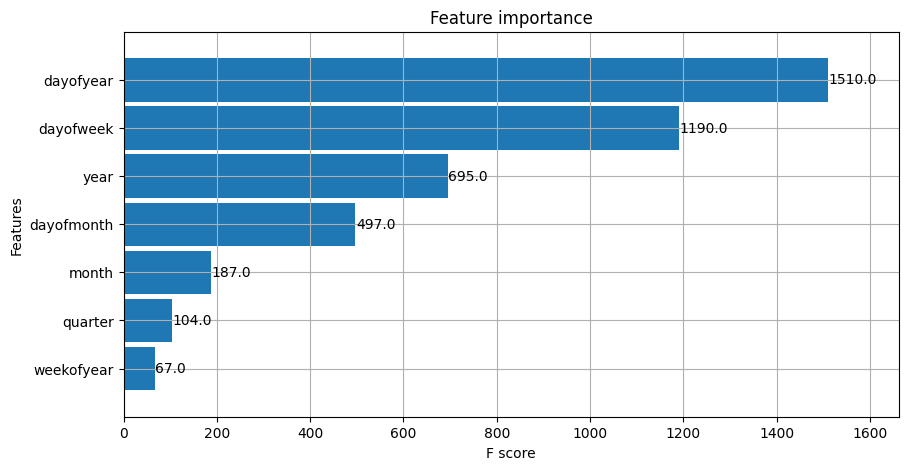

In [31]:
# Функция создания признаков
def create_features(df, label=None):
    """
    создаем признаки из datetime индекса
    """
    df['date'] = df.index
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.isocalendar().week
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
    if label:
        y = df[label]
        return X, y
    return X

X_train, y_train = create_features(sales_train, label='y')
X_test, y_test = create_features(sales_test, label='y')

X_train = X_train.astype({'weekofyear':np.int64})
X_test = X_test.astype({'weekofyear':np.int64})

# Создание модели XGBRegressor
reg = xgb.XGBRegressor(n_estimators=1000)
reg.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)

# Визуализация важности признаков
_ = plot_importance(reg, height=0.9)

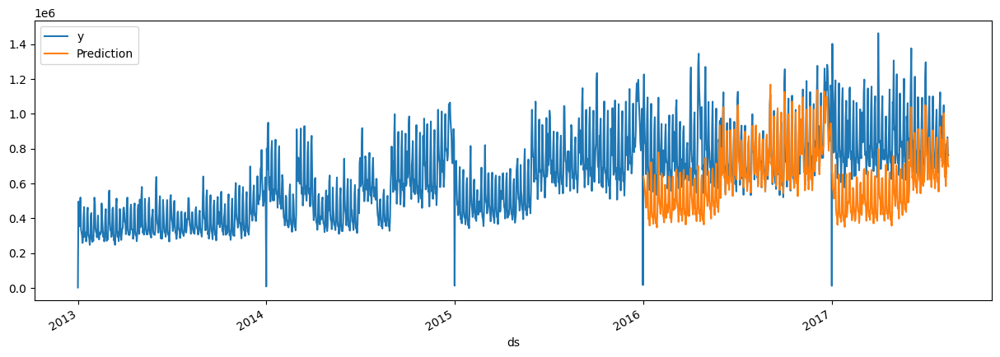

In [32]:
# Выполнение предсказания
sales_test['Prediction'] = reg.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

# Визуализация
_ = sales_all[['y','Prediction']].plot(figsize=(15, 5))

In [33]:
print('Метрики модели XGBRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction), 2) * 100)

Метрики модели XGBRegressor:
mean_squared_error = 61906229141.89
mean_absolute_error = 195362.54
mean_absolute_percentage_error = 32.0


# CatBoost

<Axes: ylabel='feature_names'>

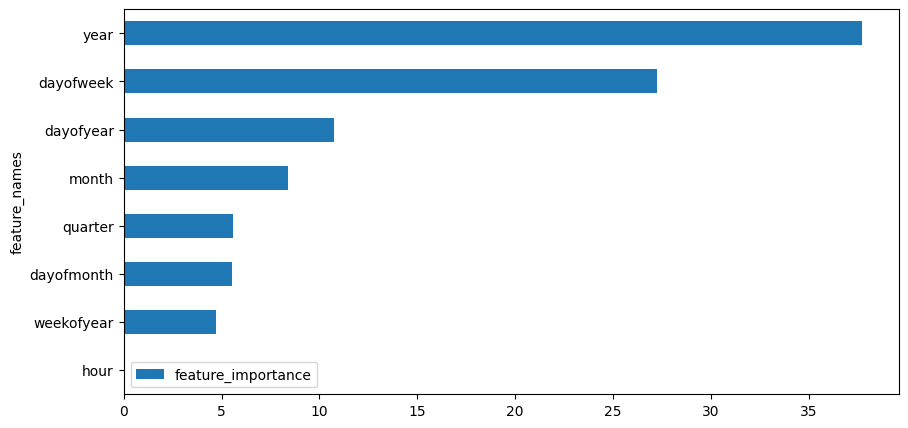

In [34]:
cbr = CatBoostRegressor(n_estimators=1000)
cbr.fit(X_train, y_train,
        eval_set=[(X_train, y_train), (X_test, y_test)],
        early_stopping_rounds=50,
        verbose=False)

# Визуализация важности признаков
imp_data = pd.DataFrame({'feature_importance': cbr.get_feature_importance(Pool(X_train, y_train)), 
              'feature_names': X_train.columns}).sort_values(by=['feature_importance'], 
                                                       ascending=False)

imp_data.sort_values(by=['feature_importance'], ascending=True).plot.barh(x='feature_names', y='feature_importance')

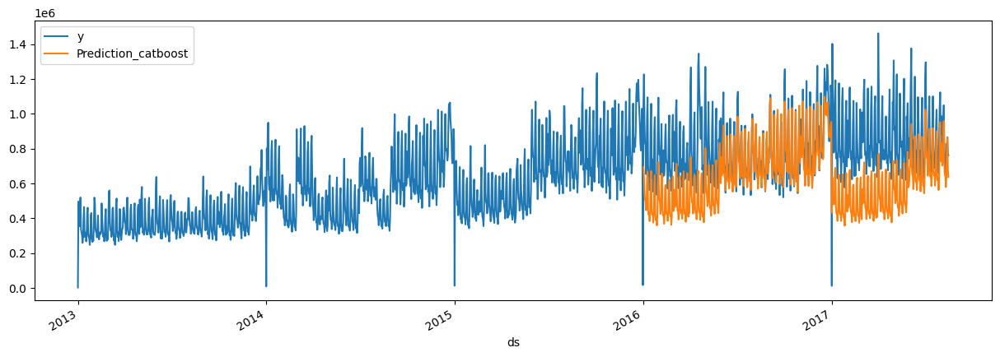

In [35]:
# Выполнение предсказания
sales_test['Prediction_catboost'] = cbr.predict(X_test)
sales_all = pd.concat([sales_test, sales_train], sort=False)

# Визуализация
_ = sales_all[['y','Prediction_catboost']].plot(figsize=(15, 5))

In [36]:
print('Метрики модели CatBoostRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction_catboost), 2) * 100)

Метрики модели CatBoostRegressor:
mean_squared_error = 61020426022.17
mean_absolute_error = 195731.24
mean_absolute_percentage_error = 28.999999999999996


# Итог

In [44]:
# Сводные результаты по построенным моделям
print('Метрики модели среднего скользящего:')
print("mean_squared_erro r=", round(mean_squared_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_error =", round(mean_absolute_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(df_103501.values[-moving_average_days:], moving_avg[-moving_average_days:]), 2) * 100)
print(('-')*60)
print('Метрики модели линейной регрессии:')
print("mean_squared_error", round(mean_squared_error(y_test, ar_predictions), 2))
print("mean_absolute_error", round(mean_absolute_error(y_test, ar_predictions), 2))
print("mean_absolute_percentage_error", round(mean_absolute_percentage_error(y_test, ar_predictions), 2) * 100)
print(('-')*60)
print('Метрики модели ARIMA:')
print("mean_squared_error =", round(mean_squared_error(y_test, arima_predictions), 2))
print("mean_absolute_error =", round(mean_absolute_error(y_test, arima_predictions), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(y_test, arima_predictions), 2) * 100)
print(('-')*60)
print('Метрики модели SARIMA:')
print("mean_squared_error =", round(mean_squared_error(y_test, sarima_predictions), 2))
print("mean_absolute_error =", round(mean_absolute_error(y_test, sarima_predictions), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(y_test, sarima_predictions), 2) * 100)
print(('-')*60)
print('Метрики модели CatBoostRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction_catboost), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction_catboost), 2) * 100)
print(('-')*60)
print('Метрики модели XGBRegressor:')
print("mean_squared_error =", round(mean_squared_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_error =", round(mean_absolute_error(sales_test.y, sales_test.Prediction), 2))
print("mean_absolute_percentage_error =", round(mean_absolute_percentage_error(sales_test.y, sales_test.Prediction), 2) * 100)

Метрики модели среднего скользящего:
mean_squared_erro r= 287.09
mean_absolute_error = 13.42
mean_absolute_percentage_error = 17.0
------------------------------------------------------------
Метрики модели линейной регрессии:
mean_squared_error 128.34
mean_absolute_error 9.61
mean_absolute_percentage_error 10.0
------------------------------------------------------------
Метрики модели ARIMA:
mean_squared_error = 35.71
mean_absolute_error = 5.97
mean_absolute_percentage_error = 6.0
------------------------------------------------------------
Метрики модели SARIMA:
mean_squared_error = 147.67
mean_absolute_error = 8.79
mean_absolute_percentage_error = 10.0
------------------------------------------------------------
Метрики модели CatBoostRegressor:
mean_squared_error = 61020426022.17
mean_absolute_error = 195731.24
mean_absolute_percentage_error = 28.999999999999996
------------------------------------------------------------
Метрики модели XGBRegressor:
mean_squared_error = 619062291

Вывод:

Показатель mean_squared_error у модели CatBoostRegressor показывает лучший результат, чем у модели XGBRegressor. Показатель mean_absolute_error у модели XGBRegressor показывает лучший результат, чем у модели CatBoostRegressor. Показатель mean_absolute_percentage_error у модели CatBoostRegressor показывает лучший результат, чем у модели XGBRegressor. Важность признаков для моделей XGBRegressor и CatBoostRegressor оказались разными.